# Lab06

Modelling Photosynthesis: Part 2 (Coupled Gas-Exchange Model)

<div class="alert alert-warning">
If figures/tables are not rendered correctly, make sure your notebook is `trusted` by running `Trust Notebook` operation found in `Commands` (third icon from the top on the toolbar located left-hand side). You can easily find this menu by typing in "trust" in the search box there.
</div>

In [1]:
using Cropbox

We will use a new interactive plotting feature in this notebook. Currently, manual setup for [WebIO.jl](https://github.com/JuliaGizmos/WebIO.jl) is required when using [prebuilt system images](https://github.com/JuliaLang/PackageCompiler.jl) as we have with our JupyterHub environment.

In [2]:
Cropbox.Interact.WebIO.setup(:ijulia)

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-9475995172105029162\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-14472542125285801772\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-9475995172105029162\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

Our bisection method by default prints out warning messages when it can't find a solution within a given range, for example, when we try running simulation with an extreme condition (*i.e.* some zero values for parameters). Let's make it quiet.

In [3]:
using Logging
Logging.disable_logging(Logging.Warn)

LogLevel(1001)

## Cropbox

Before going into the model, let's briefly talk about the kinds of variable we didn't have a chance to use in the previous tutorial.

### Call

`call` makes a *callable* variable which works like a function. Depending variables declared in the argument list before `;` are mapped to other existing variables as usual. Variables declared after `;` indicates arguments needed when calling this `call` variable.

In the example below, `f` is a `call`-kind variable which is dependent on `a` and callable with `x`. Look at how it's called in the declaration of variable `f2`.

In [4]:
@system SCall(Controller) begin
    a => 1 ~ preserve
    f(a; x) => a + x ~ call
    f2(f) => f(2) ~ track
end

SCall

In [5]:
simulate(SCall)

,tick,a,f2
,Quantit…,Float64,Float64
1,0.0 hr,1.0,3.0


### Solve

`solve` calculates a solution of polynomial equation defined inside the body. The equation is solved for the name of variable itself. Solution for the equation is derived by symbolic algebraFor example, 

In [6]:
@system SSolve(Controller) begin
    a => 1 ~ preserve
    b => 2 ~ preserve
    c => 1 ~ preserve
    x(a, b, c) => a*x^2 + b*x + c ~ solve
end

SSolve

In [7]:
simulate(SSolve)

,tick,a,b,c,x
,Quantit…,Float64,Float64,Float64,Float64
1,0.0 hr,1.0,2.0,1.0,-1.0


### Bisect

In [8]:
@system SBisect(Controller) begin
    x(x) => x - 1 ~ bisect(lower=0, upper=2)
end

SBisect

In [9]:
simulate(SBisect)

,tick,x
,Quantit…,Float64
1,0.0 hr,1.0


## Model

Gas exchange models were originally derived from [MAIZSIM](https://github.com/ARS-CSGCL-DT/MAIZSIM) and reimplemented with Cropbox framework.

### Environment

$$
e_s[T] = 0.611 \cdot \exp\!\left[ \frac{17.502 \cdot T}{240.97 + T} \right]
$$

In [10]:
@system VaporPressure begin
    a => 0.611 ~ preserve(u"kPa", parameter)
    b => 17.502 ~ preserve(parameter)
    c => 240.97 ~ preserve(parameter)

    es(a, b, c; T(u"°C")): saturation => (t = deunitfy(T); a*exp((b*t)/(c+t))) ~ call(u"kPa")
    ea(es; T(u"°C"), RH(u"percent")): ambient => es(T) * RH ~ call(u"kPa")
    D(es; T(u"°C"), RH(u"percent")): deficit => es(T) * (1 - RH) ~ call(u"kPa")
    RH(es; T(u"°C"), VPD(u"kPa")): relative_humidity => 1 - VPD / es(T) ~ call(u"NoUnits")

    Δ(es, b, c; T(u"°C")): saturation_slope_delta => (e = es(T); t = deunitfy(T); e*(b*c)/(c+t)^2 / u"K") ~ call(u"kPa/K")
    s(Δ; T(u"°C"), P(u"kPa")): saturation_slope => Δ(T) / P ~ call(u"K^-1")
end

VaporPressure

In [11]:
@system Weather begin
    vp(context): vapor_pressure ~ ::VaporPressure

    PFD: photon_flux_density => 2000 ~ preserve(u"μmol/m^2/s", parameter)
    CO2: carbon_dioxide => 400 ~ preserve(u"μmol/mol", parameter)
    RH: relative_humidity => 66 ~ preserve(u"percent", parameter)
    T_air: air_temperature => 32 ~ preserve(u"°C", parameter)
    Tk_air(T_air): absolute_air_temperature ~ track(u"K")
    wind: wind_speed => 2.0 ~ preserve(u"m/s", parameter)
    P_air: air_pressure => 99.4 ~ preserve(u"kPa", parameter)

    VPD(T_air, RH, D=vp.D): vapor_pressure_deficit => D(T_air, RH) ~ track(u"kPa")
    VPD_Δ(T_air, Δ=vp.Δ): vapor_pressure_saturation_slope_delta => Δ(T_air) ~ track(u"kPa/K")
    VPD_s(T_air, P_air, s=vp.s): vapor_pressure_saturation_slope => s(T_air, P_air) ~ track(u"K^-1")
end

Weather

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$\mathcal{D}_w$ | 24.2 | $\mathrm{mm^2}$ $\mathrm{s^{-1}}$ | Diffusion coefficient for water vapor in air at 20 $\mathrm{^{\circ}C}$ |
$\mathcal{D}_c$ | 14.7 | $\mathrm{mm^2}$ $\mathrm{s^{-1}}$ | Diffusion coefficient for $\mathrm{CO_2}$ in air at 20 $\mathrm{^{\circ}C}$ |
$\mathcal{D}_h$ | 21.5 | $\mathrm{mm^2}$ $\mathrm{s^{-1}}$ | Diffusion coefficient for heat (thermal diffusivity) in air at 20 $\mathrm{^{\circ}C}$ |
$\mathcal{D}_m$ | 15.1 | $\mathrm{mm^2}$ $\mathrm{s^{-1}}$ | Diffusion coefficient for momentum (kinematic viscosity) in air at 20 $\mathrm{^{\circ}C}$ |

In [12]:
@system Diffusion begin
    Dw: diffusion_coeff_for_water_vapor_in_air_at_20 => 24.2 ~ preserve(u"mm^2/s", parameter)
    Dc: diffusion_coeff_for_co2_in_air_at_20 => 14.7 ~ preserve(u"mm^2/s", parameter)
    Dh: diffusion_coeff_for_heat_in_air_at_20 => 21.5 ~ preserve(u"mm^2/s", parameter)
    Dm: diffusion_coeff_for_momentum_in_air_at_20 => 15.1 ~ preserve(u"mm^2/s", parameter)
end

Diffusion

$$
\begin{align}
I_2 &= \frac{(1 - f)}{2} I_a \\
I_a &= \alpha I
\end{align}
$$

| Symbol | Units | Description |
|:-------|:------|:------------|
$I$ | $\mathrm{\mu mol_{quanta}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Incident PAR |
$I_a$ | $\mathrm{\mu mol_{quanta}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Absorbed PAR |
$I_2$ | $\mathrm{\mu mol_{quanta}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Effective PAR |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$\alpha$ | 0.85 | - | Leaf absorptance in PAR |
$\delta$ | 0.15 | - | Leaf scattering factor |
$f$ | 0.15 | - | Leaf spectral correction factor |

In [13]:
@system Irradiance begin
    PFD ~ hold
    PPFD(PFD): photosynthetic_photon_flux_density ~ track(u"μmol/m^2/s")

    δ: leaf_scattering => 0.15 ~ preserve(parameter)
    f: leaf_spectral_correction => 0.15 ~ preserve(parameter)

    Ia(PPFD, δ): absorbed_irradiance => begin
        PPFD * (1 - δ)
    end ~ track(u"μmol/m^2/s")

    I2(Ia, f): effective_irradiance => begin
        Ia * (1 - f) / 2
    end ~ track(u"μmol/m^2/s")
end

Irradiance

### Photosynthesis

#### Common

$$
\begin{align}
k_{T_A}[T_k, E_a] &= \exp\!\left[ \frac{E_a ( T_k - T_{b_k} )}{R \cdot T_k \cdot T_{b_k}} \right] \\
k_{T_Q}[T] &= Q_{10}^{\frac{T - T_b}{10}} \\
k_{T_P}[T_k, E_a, H, S] &= k_{T_A}[T_k, E_a] \cdot \left( 1 + \exp\!\left[ \frac{S \cdot T_{b_k} - H}{R \cdot T_{b_k}} \right] \right) \left( 1 + \exp\!\left[ \frac{S \cdot T_k - H}{R \cdot T_k} \right] \right)^{-1} \\
\end{align}
$$

| Symbol | Units | Description |
|:-------|:------|:------------|
| $k_{T_A}$ | - | Temperature dependence by Arrhenius equation |
| $k_{T_Q}$ | - | Temperature dependence by $Q_{10}$ function |
| $k_{T_P}$ | - | Temperature dependence by a peaked function |
| $T_a$ | $\mathrm{^{\circ}C}$ | Air temperature in Celsius |
| $T_{a_k}$ | $\mathrm{K}$ | Air temperature in Kelvin |
| $T_l$ | $\mathrm{^{\circ}C}$ | Leaf temperature in Celsius |
| $T_{l_k}$ | $\mathrm{K}$ | Leaf temperature in Kelvin |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$R$ | 8.314 | $\mathrm{J}$ $\mathrm{K^{-1}}$ $\mathrm{mol}$ | Universal gas constant |

In [14]:
@system TemperatureDependence begin
    T: leaf_temperature ~ hold
    Tk(T): absolute_leaf_temperature ~ track(u"K")

    Tb: base_temperature => 25 ~ preserve(u"°C", parameter)
    Tbk(Tb): absolute_base_temperature ~ preserve(u"K")

    kT(T, Tk, Tb, Tbk; Ea(u"kJ/mol")): arrhenius_equation => begin
        exp(Ea * (T - Tb) / (u"R" * Tk * Tbk))
    end ~ call

    kTpeak(Tk, Tbk, kT; Ea(u"kJ/mol"), S(u"J/mol/K"), H(u"kJ/mol")): peaked_function => begin
        R = u"R"
        kT(Ea) * (1 + exp((S*Tbk - H) / (R*Tbk))) / (1 + exp((S*Tk - H) / (R*Tk)))
    end ~ call

    Q10 => 2 ~ preserve(parameter)
    kTQ10(T, Tb, Q10): q10_rate => begin
        Q10^((T - Tb) / 10u"K")
    end ~ track
end

TemperatureDependence

$$
k_{N} = \frac{2}{1 + \exp\!\left[ -s \cdot \max \{ N_0, N \} - N_0 \right]} - 1
$$

| Symbol | Units | Description |
|:-------|:------|:------------|
| $k_N$ | - | Nitrogen dependence |
| $N$ | $\mathrm{g}$ $\mathrm{m^{-2}}$ | Leaf nitrogen content |
| $N_p$ | $\mathrm{\%}$ | Relative leaf nitrogen content assuming SLA = 200 $\mathrm{cm^2}$ $\mathrm{g^{-1}}$ |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$N_0$ | 0.343 | $\mathrm{g}$ $\mathrm{m^{-2}}$ | Baseline leaf nitrogen content |
$s$ | 4.191 | $\mathrm{m^2}$ $\mathrm{g^{-1}}$ | Steepness of nitrogen response curve |

In [15]:
@system NitrogenDependence begin
    N: leaf_nitrogen_content => 4.0 ~ preserve(u"g/m^2", parameter)
    s => 4.191 ~ preserve(u"m^2/g", parameter)
    N0 => 0.343 ~ preserve(u"g/m^2", parameter)

    kN(N, s, N0): nitrogen_limited_rate => begin
        2 / (1 + exp(-s * (max(N0, N) - N0))) - 1
    end ~ track

    Np(N, SLA) => N * SLA ~ track(u"percent")
    SLA: specific_leaf_area => 200 ~ preserve(u"cm^2/g")
end

NitrogenDependence

In [16]:
@system CBase(TemperatureDependence, NitrogenDependence) begin
    Ci: intercellular_co2 ~ hold
    I2: effective_irradiance ~ hold
end

CBase

#### C3

| Symbol | Units | Description |
|:-------|:------|:------------|
| $A_c$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Rubisco-limited $\mathrm{CO_2}$ assimilation rate |
| $A_j$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Electron transport-limited $\mathrm{CO_2}$ assimilation rate |
| $A_n$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Net photosynthesis rate |
| $A_p$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Triose phosphate utilization-limited $\mathrm{CO_2}$ assimilation rate |
| $C_a$ | $\mathrm{\mu bar}$ | Atmospheric $\mathrm{CO_2}$ partial pressure |
| $C_i$ | $\mathrm{\mu bar}$ | Intercellular $\mathrm{CO_2}$ partial pressure |
| $C_m$ | $\mathrm{\mu bar}$ | Mesophyll $\mathrm{CO_2}$ partial pressure |
| $\Gamma$ | $\mathrm{\mu bar}$ | $\mathrm{CO_2}$ compensation point |
| $J$ | $\mathrm{\mu mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Electron transport rate |
| $J_{\max}$ | $\mathrm{\mu mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of electron transport |
| $K_c$ | $\mathrm{\mu bar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{CO_2}$ |
| $K_m$ | $\mathrm{\mu bar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{CO_2}$ in presence of $\mathrm{O_2}$ |
| $K_o$ | $\mathrm{mbar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{O_2}$ |
| $P_a$ | $\mathrm{kPa}$ | Atmospheric pressure |
| $R_d$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Mitochondrial respiration rate |
| $r_{v_c}$ | $\mathrm{m^2}$ $\mathrm{s}$ $\mathrm{mol^{-1}_{CO_2}}$ $\mathrm{bar}$ | Total leaf resistance to $\mathrm{CO_2}$ |
| $T_p$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of triose phosphate utilization |
| $V_{c\!\max}$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of Rubisco carboxylation |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$E_{ac}$ | 79.43 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $K_c$ |
$E_{ag}$ | 37.83 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $\Gamma$ |
$E_{aj}$ | 23.9976 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $J_{\max}$ |
$E_{ao}$ | 36.38 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $K_o$ |
$E_{ar}$ | 49.39 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $R_d$ |
$E_{aVc}$ | 52.1573 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $V_{c\!\max}$ |
$E_{aTp}$ | 47.10 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $T_p$ |
$\Gamma_{25}$ | 42.75 | $\mathrm{\mu bar}$ | $\mathrm{CO_2}$ compensation point at 25 $\mathrm{^{\circ}C}$ |
$H_j$ | 200 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Curvature parameter for $J_{\max}$ |
$J_{\max_{25}}$ | 169 | $\mathrm{mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Maximum rate of electron transport at 25 $\mathrm{^{\circ}C}$ |
$K_{c_{25}}$ | 404.9 | $\mathrm{\mu bar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{CO_2}$ at 25 $\mathrm{^{\circ}C}$ |
$K_{o_{25}}$ | 278.4 | $\mathrm{mbar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{O_2}$ at 25 $\mathrm{^{\circ}C}$ |
$O_m$ | 210 | $\mathrm{mbar}$ | Mesophyll $\mathrm{O_2}$ partial pressure |
$R_{d_{25}}$ | 1.08 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Mitochondrial respiration rate at 25 $\mathrm{^{\circ}C}$ |
$S_j$ | 616.4 | $\mathrm{J}$ $\mathrm{mol^{-1}}$ $\mathrm{K}$ | Entropy factor for $J_{\max}$ |
$\theta$ | 0.7 | - | Sharpness of transition between light limitation and saturation |
$T_b$ | 25 | $\mathrm{^{\circ}C}$ | Base temperature in Celsius |
$T_{b_k}$ | 298.15 | $\mathrm{K}$ | Base temperature in Kelvin |
$T_{p_{25}}$ | 16.03 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Triose phosphate utilization rate at 25 $\mathrm{^{\circ}C}$ |
$V_{c\!\max_{25}}$ | 108.4 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of Rubisco carboxylation at 25 $\mathrm{^{\circ}C}$ |

In [17]:
@system C3Base(CBase)

C3Base

In [18]:
@system C3c(C3Base) begin
    Kc25: rubisco_constant_for_co2_at_25 => 404.9 ~ preserve(u"μbar", parameter)
    Eac: activation_energy_for_co2 => 79.43 ~ preserve(u"kJ/mol", parameter)
    Kc(Kc25, kT, Eac): rubisco_constant_for_co2 => begin
        Kc25 * kT(Eac)
    end ~ track(u"μbar")

    Ko25: rubisco_constant_for_o2_at_25 => 278.4 ~ preserve(u"mbar", parameter)
    Eao: activation_energy_for_o2 => 36.38 ~ preserve(u"kJ/mol", parameter)
    Ko(Ko25, kT, Eao): rubisco_constant_for_o2 => begin
        Ko25 * kT(Eao)
    end ~ track(u"mbar")

    Om: mesophyll_o2_partial_pressure => 210 ~ preserve(u"mbar", parameter)
    Km(Kc, Om, Ko): rubisco_constant_for_co2_with_o2 => begin
        Kc * (1 + Om / Ko)
    end ~ track(u"μbar")

    Vcm25: maximum_carboxylation_rate_at_25 => 108.4 ~ preserve(u"μmol/m^2/s", parameter)
    EaVc: activation_energy_for_carboxylation => 52.1573 ~ preserve(u"kJ/mol", parameter)
    Vcmax(Vcm25, kT, EaVc, kN): maximum_carboxylation_rate => begin
        Vcm25 * kT(EaVc) * kN
    end ~ track(u"μmol/m^2/s")
end

C3c

$$
J = \min\!h \{ I_2, J_{\max}, \theta \}
$$

In [19]:
@system C3j(C3Base) begin
    Jm25: maximum_electron_transport_rate_at_25 => 169.0 ~ preserve(u"μmol/m^2/s", parameter)
    Eaj: activation_energy_for_electron_transport => 23.9976 ~ preserve(u"kJ/mol", parameter)
    Sj: electron_transport_temperature_response => 616.4 ~ preserve(u"J/mol/K", parameter)
    Hj: electron_transport_curvature => 200 ~ preserve(u"kJ/mol", parameter)
    Jmax(Jm25, kTpeak, Eaj, Sj, Hj, kN): maximum_electron_transport_rate => begin
        Jm25 * kTpeak(Eaj, Sj, Hj) * kN
    end ~ track(u"μmol/m^2/s")

    θ: light_transition_sharpness => 0.7 ~ preserve(parameter)
    J(I2, Jmax, θ): electron_transport_rate => begin
        θ*J^2 - (I2+Jmax)*J + I2*Jmax ⩵ 0
    end ~ solve(lower=0, upper=Jmax, u"μmol/m^2/s")
end

C3j

In [20]:
@system C3p(C3Base) begin
    Tp25: triose_phosphate_limitation_at_25 => 16.03 ~ preserve(u"μmol/m^2/s", parameter)
    Eap: activation_energy_for_Tp => 47.10 ~ preserve(u"kJ/mol", parameter)
    Tp(Tp25, kT, Eap, kN): triose_phosphate_utilization => begin
        Tp25 * kT(Eap) * kN
    end ~ track(u"μmol/m^2/s")
end

C3p

In [21]:
@system C3r(C3Base) begin
    Rd25: dark_respiration_at_25 => 1.08 ~ preserve(u"μmol/m^2/s", parameter)
    Ear: activation_energy_for_respiration => 49.39 ~ preserve(u"kJ/mol", parameter)
    Rd(Rd25, kT, Ear): dark_respiration => begin
        Rd25 * kT(Ear)
    end ~ track(u"μmol/m^2/s")

    Γ25: co2_compensation_point_at_25 => 42.75 ~ preserve(u"μbar", parameter)
    Eag: activation_energy_for_co2_compensation_point => 37.83 ~ preserve(u"kJ/mol", parameter)
    Γ(Γ25, kT, Eag): co2_compensation_point => begin
        Γ25 * kT(Eag)
    end ~ track(u"μbar")
end

C3r

$$
A_n = \min \{ A_c, A_j, A_p \}
$$

$$
A_c = V_{c\!\max} \frac{C_i - \Gamma}{C_i + K_c \cdot (1 + \frac{O_m}{K_o})} - R_d
$$

$$
A_j = \frac{J \cdot (C_i - \Gamma)}{4 (C_i + 2 \Gamma)} - R_d
$$

$$
A_p = 3T_p - R_d
$$

In [22]:
@system C3Rate(C3c, C3j, C3p, C3r) begin
    Ac(Vcmax, Ci, Γ, Km, Rd): enzyme_limited_photosynthesis_rate => begin
        Vcmax * (Ci - Γ) / (Ci + Km) - Rd
    end ~ track(u"μmol/m^2/s")

    Aj(J, Ci, Γ, Rd): transport_limited_photosynthesis_rate => begin
        J * (Ci - Γ) / 4(Ci + 2Γ) - Rd
    end ~ track(u"μmol/m^2/s")

    Ap(Tp, Rd): triose_phosphate_limited_photosynthesis_rate => begin
        3Tp - Rd
    end ~ track(u"μmol/m^2/s")

    A_net(Ac, Aj, Ap): net_photosynthesis => begin
        min(Ac, Aj, Ap)
    end ~ track(u"μmol/m^2/s")

    A_gross(A_net, Rd): gross_photosynthesis => begin
        A_net + Rd
    end ~ track(u"μmol/m^2/s")
end

C3Rate

In [23]:
@system C3(C3Rate)

C3

#### Ex 6.1.1)

Examine how the following individual components of a coupled gas-exchange model are implemented in Cropbox: 1) FvCB model for C3 photosynthesis.

In [24]:
@system C3Controller(C3, Controller) begin
    T: leaf_temperature => 25 ~ preserve(u"°C", parameter)
    Ci: intercellular_co2 => 300 ~ preserve(u"μbar", parameter)
    I2: effective_irradiance => 600 ~ preserve(u"μmol/m^2/s", parameter)
end

C3Controller

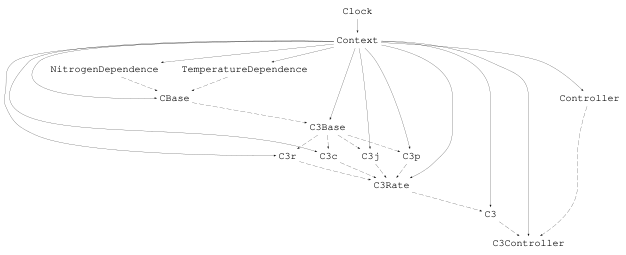

In [25]:
Cropbox.hierarchy(C3Controller)

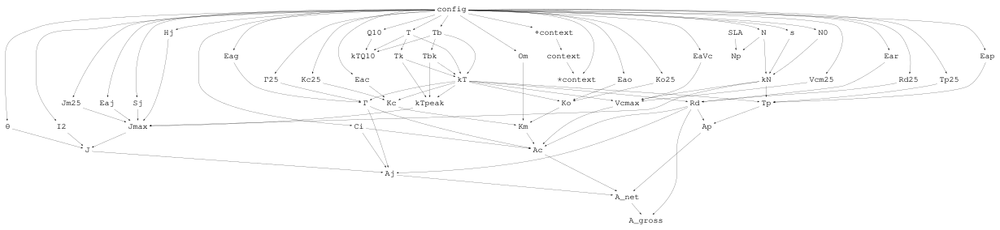

In [26]:
Cropbox.dependency(C3Controller)

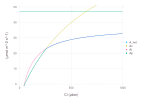

In [27]:
visualize(C3Controller, :Ci, [:A_net, :Ac, :Aj, :Ap];
    xstep = :0 => :Ci => 0:1000,
    ylim = (0,50),
    kind = :line
)

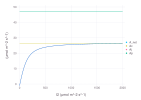

In [28]:
visualize(C3Controller, :I2, [:A_net, :Ac, :Aj, :Ap];
    xstep = :0 => :I2 => 0:2000,
    ylim = (0,50),
    kind = :line
)

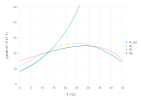

In [29]:
visualize(C3Controller, :T, [:A_net, :Ac, :Aj, :Ap];
    xstep = :0 => :T => 0:45,
    ylim = (0,50),
    kind = :line
)

#### C4

| Symbol | Units | Description |
|:-------|:------|:------------|
| $A_c$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Rubisco-limited $\mathrm{CO_2}$ assimilation rate |
| $A_j$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Electron transport-limited $\mathrm{CO_2}$ assimilation rate |
| $A_n$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Net photosynthesis rate |
| $C_a$ | $\mathrm{\mu bar}$ | Atmospheric $\mathrm{CO_2}$ partial pressure |
| $C_i$ | $\mathrm{\mu bar}$ | Intercellular $\mathrm{CO_2}$ partial pressure |
| $C_m$ | $\mathrm{\mu bar}$ | Mesophyll $\mathrm{CO_2}$ partial pressure |
| $J$ | $\mathrm{\mu mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Electron transport rate |
| $J_{\max}$ | $\mathrm{\mu mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of electron transport |
| $K_c$ | $\mathrm{\mu bar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{CO_2}$ |
| $K_p$ | $\mathrm{\mu bar}$ | Michaelis-Menton constant of PEPC for $\mathrm{CO_2}$ |
| $P_a$ | $\mathrm{kPa}$ | Atmospheric pressure |
| $R_d$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Mitochondrial respiration rate |
| $r_{v_c}$ | $\mathrm{m^2}$ $\mathrm{s}$ $\mathrm{mol^{-1}_{CO_2}}$ $\mathrm{bar}$ | Total leaf resistance to $\mathrm{CO_2}$ |
| $V_p$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | $\mathrm{C_4}$ carboxylation rate |
| $V_{pr}$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | PEP regeneration rate |
| $V_{c\!\max}$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of Rubisco carboxylation |
| $V_{p\!\max}$ | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of $\mathrm{C_4}$ carboxylation |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$\beta$ | 0.99 | - | Sharpness of transition between $A_c$ and $A_j$ |
$E_{ac}$ | 55.9 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $V_{c\!\max}$ |
$E_{aj}$ | 32.8 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $J_{\max}$ |
$E_{ap}$ | 75.1 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $V_{p\!\max}$ |
$E_{ar}$ | 39.8 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Activation energy for $R_d$ |
$g_{bs}$ | 0.003 | $\mathrm{mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Bundle-sheath conductance to $\mathrm{CO_2}$ |
$H_j$ | 220 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Curvature parameter for $J_{\max}$ |
$J_{\max_{25}}$ | 300 | $\mathrm{mol_{electron}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Maximum rate of electron transport at 25 $\mathrm{^{\circ}C}$ |
$K_{c_{25}}$ | 650 | $\mathrm{\mu bar}$ | Michaelis-Menton constant of Rubisco for $\mathrm{CO_2}$ at 25 $\mathrm{^{\circ}C}$ |
$K_{p_{25}}$ | 80 | $\mathrm{\mu bar}$ | Michaelis-Menton constant of PEPC for $\mathrm{CO_2}$ at 25 $\mathrm{^{\circ}C}$ |
$R_{d_{25}}$ | 2 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Mitochondrial respiration rate at 25 $\mathrm{^{\circ}C}$ |
$S_j$ | 702.6 | $\mathrm{J}$ $\mathrm{mol^{-1}}$ $\mathrm{K}$ | Entropy factor for $J_{\max}$ |
$\theta$ | 0.5 | - | Sharpness of transition between light limitation and saturation |
$T_b$ | 25 | $\mathrm{^{\circ}C}$ | Base temperature in Celsius |
$T_{b_k}$ | 298.15 | $\mathrm{K}$ | Base temperature in Kelvin |
$V_{c\!\max_{25}}$ | 50 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of Rubisco carboxylation at 25 $\mathrm{^{\circ}C}$ |
$V_{p\!\max_{25}}$ | 70 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Maximum rate of PEP carboxylation at 25 $\mathrm{^{\circ}C}$ |
$V_{pr_{25}}$ | 80 | $\mathrm{\mu mol_{CO_2}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | PEP regeneration rate at 25 $\mathrm{^{\circ}C}$ |
$x$ | 0.4 | - | Partitioning factor of electron transport rate |

In [30]:
@system C4Base(CBase) begin
    Cm(Ci): mesophyll_co2 ~ track(u"μbar")
    gbs: bundle_sheath_conductance => 0.003 ~ preserve(u"mol/m^2/s/bar", parameter)
end

C4Base

$$
V_p = \min \Bigg\{ \frac{C_m V_{p\!\max}}{C_m + K_p}, V_{pr} \Bigg\}
$$

In [31]:
@system C4c(C4Base) begin
    Kp25: pep_carboxylase_constant_for_co2_at_25 => 80 ~ preserve(u"μbar", parameter)
    Kp(Kp25, kTQ10): pep_carboxylase_constant_for_co2 => begin
        Kp25 * kTQ10
    end ~ track(u"μbar")

    Vpm25: maximum_pep_carboxylation_rate_for_co2_at_25 => 70 ~ preserve(u"μmol/m^2/s", parameter)
    EaVp: activation_energy_for_pep_carboxylation => 75.1 ~ preserve(u"kJ/mol", parameter)
    Vpmax(Vpm25, kT, EaVp, kN): maximum_pep_carboxylation_rate => begin
        Vpm25 * kT(EaVp) * kN
    end ~ track(u"μmol/m^2/s")

    Vpr25: regeneration_limited_pep_carboxylation_rate_for_co2_at_25 => 80 ~ preserve(u"μmol/m^2/s", parameter)
    Vpr(Vpr25, kTQ10): regeneration_limited_pep_carboxylation_rate => begin
        Vpr25 * kTQ10
    end ~ track(u"μmol/m^2/s")
    Vp(Vpmax, Vpr, Cm, Kp): pep_carboxylation_rate => begin
        (Cm * Vpmax) / (Cm + Kp)
    end ~ track(u"μmol/m^2/s", max=Vpr)

    Vcm25: maximum_carboxylation_rate_at_25 => 50 ~ preserve(u"μmol/m^2/s", parameter)
    EaVc: activation_energy_for_carboxylation => 55.9 ~ preserve(u"kJ/mol", parameter)
    Vcmax(Vcm25, kT, EaVc, kN): maximum_carboxylation_rate => begin
        Vcm25 * kT(EaVc) * kN
    end ~ track(u"μmol/m^2/s")
end

C4c

$$
J = \min\!h \{ I_2, J_{\max}, \theta \}
$$

In [32]:
@system C4j(C4Base) begin
    Jm25: maximum_electron_transport_rate_at_25 => 300 ~ preserve(u"μmol/m^2/s", parameter)
    Eaj: activation_energy_for_electron_transport => 32.8 ~ preserve(u"kJ/mol", parameter)
    Sj: electron_transport_temperature_response => 702.6 ~ preserve(u"J/mol/K", parameter)
    Hj: electron_transport_curvature => 220 ~ preserve(u"kJ/mol", parameter)
    Jmax(Jm25, kTpeak, Eaj, Sj, Hj, kN): maximum_electron_transport_rate => begin
        Jm25 * kTpeak(Eaj, Sj, Hj) * kN
    end ~ track(u"μmol/m^2/s")

    θ: light_transition_sharpness => 0.5 ~ preserve(parameter)
    J(I2, Jmax, θ): electron_transport_rate => begin
        θ*J^2 - (I2+Jmax)*J + I2*Jmax ⩵ 0
    end ~ solve(lower=0, upper=Jmax, u"μmol/m^2/s")
end

C4j

In [33]:
@system C4r(C4Base) begin
    Kc25: rubisco_constant_for_co2_at_25 => 650 ~ preserve(u"μbar", parameter)
    Eac: activation_energy_for_co2 => 59.4 ~ preserve(u"kJ/mol", parameter)
    Kc(kT, Kc25, Eac): rubisco_constant_for_co2 => begin
        Kc25 * kT(Eac)
    end ~ track(u"μbar")

    Ko25: rubisco_constant_for_o2_at_25 => 450 ~ preserve(u"mbar", parameter)
    Eao: activation_energy_for_o2 => 36 ~ preserve(u"kJ/mol", parameter)
    Ko(Ko25, kT, Eao): rubisco_constant_for_o2 => begin
        Ko25 * kT(Eao)
    end ~ track(u"mbar")

    Om: mesophyll_o2_partial_pressure => 210 ~ preserve(u"mbar", parameter)
    Km(Kc, Om, Ko): rubisco_constant_for_co2_with_o2 => begin
        Kc * (1 + Om / Ko)
    end ~ track(u"μbar")

    Rd25: dark_respiration_at_25 => 2 ~ preserve(u"μmol/m^2/s", parameter)
    Ear: activation_energy_for_respiration => 39.8 ~ preserve(u"kJ/mol", parameter)
    Rd(Rd25, kT, Ear): dark_respiration => begin
        Rd25 * kT(Ear)
    end ~ track(u"μmol/m^2/s")
    Rm(Rd) => 0.5Rd ~ track(u"μmol/m^2/s")
end

C4r

$$
A_n = \min\!h \{ A_c, A_j, \beta \}
$$

$$
\begin{align}
A_c &= \min \{ A_{c_1}, A_{c_2} \} \\
A_{c_1} &= V_p + g_{bs} C_m - R_m \\
A_{c_2} &= V_{c\!\max} - R_d \\
\end{align}
$$

$$
\begin{align}
A_j &= \min \{ A_{j_1}, A_{j_2} \} \\
A_{j_1} &= \frac{xJ}{2} - R_m + g_{bs} C_m \\
A_{j_2} &= \frac{(1-x)J}{3} - R_d \\
\end{align}
$$

In [34]:
@system C4Rate(C4c, C4j, C4r) begin
    Ac1(Vp, gbs, Cm, Rm) => (Vp + gbs*Cm - Rm) ~ track(u"μmol/m^2/s")
    Ac2(Vcmax, Rd) => (Vcmax - Rd) ~ track(u"μmol/m^2/s")
    Ac(Ac1, Ac2): enzyme_limited_photosynthesis_rate => begin
        min(Ac1, Ac2)
    end ~ track(u"μmol/m^2/s")

    x: electron_transport_partitioning_factor => 0.4 ~ preserve(parameter)
    Aj1(x, J, Rm, gbs, Cm) => (x * J/2 + gbs*Cm - Rm) ~ track(u"μmol/m^2/s")
    Aj0(x, J, Rm, gbs, Cm) => (x * J/2 - gbs*Cm - Rm) ~ track(u"μmol/m^2/s")
    Aj2(x, J, Rd) => (1-x) * J/3 - Rd ~ track(u"μmol/m^2/s")
    Aj(Aj1, Aj2): transport_limited_photosynthesis_rate => begin
        min(Aj1, Aj2)
    end ~ track(u"μmol/m^2/s")

    β: photosynthesis_transition_factor => 0.99 ~ preserve(parameter)
    A_net(Ac, Aj, β): net_photosynthesis => begin
        x = A_net
        a = β
        b = -(Ac+Aj)
        c = Ac*Aj
        a*x^2 + b*x + c ⩵ 0
    end ~ solve(pick=:minimum, u"μmol/m^2/s")

    A_gross(A_net, Rd): gross_photosynthesis => begin
        A_gross = A_net + Rd
    end ~ track(u"μmol/m^2/s")
end

C4Rate

In [35]:
@system C4(C4Rate)

C4

#### Ex 6.2.

Examine how the biochemical model of C4 photosynthesis by von Caemmerer is implemented in Cropbox.

In [36]:
@system C4Controller(C4, Controller) begin
    T: leaf_temperature => 25 ~ preserve(u"°C", parameter)
    Ci: intercellular_co2 => 300 ~ preserve(u"μbar", parameter)
    I2: effective_irradiance => 600 ~ preserve(u"μmol/m^2/s", parameter)
end

C4Controller

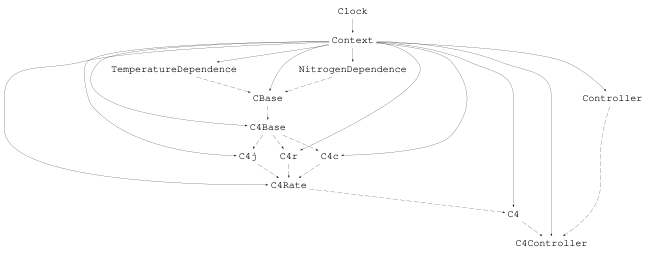

In [37]:
Cropbox.hierarchy(C4Controller)

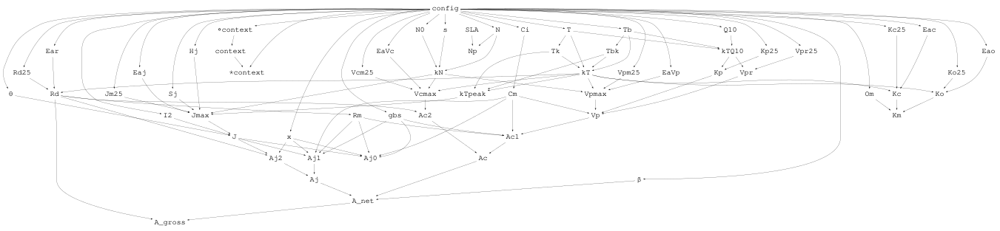

In [38]:
Cropbox.dependency(C4Controller)

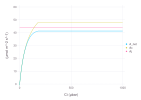

In [39]:
visualize(C4Controller, :Ci, [:A_net, :Ac, :Aj];
    xstep = :0 => :Ci => 0:1000,
    ylim = (0,60),
    kind = :line
)

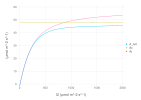

In [40]:
visualize(C4Controller, :I2, [:A_net, :Ac, :Aj];
    xstep = :0 => :I2 => 0:2000,
    ylim = (0,60),
    kind = :line
)

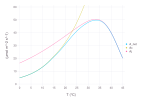

In [41]:
visualize(C4Controller, :T, [:A_net, :Ac, :Aj];
    xstep = :0 => :T => 0:45,
    ylim = (0,60),
    kind = :line
)

### Interface

#### Boundary Layer

$$
\begin{align}
g_H &= \frac{\mathcal{D}_h \cdot \mathtt{Nu}}{d} \\
\mathtt{Nu} &= 0.60 \sqrt{\mathtt{Re}} \\
\mathtt{Re} &= \frac{u \cdot d}{\mathcal{D}_m} \\
d &= 0.72 w \label{eq:g_H:d} \\
g_h &= g_H \cdot \frac{P_a}{R \cdot T_{a_k}} \\
g_b &= \frac{g_h}{P_a} \cdot {\left( \frac{\mathcal{D}_w}{\mathcal{D}_h} \right)}^{\!\frac{2}{3}} \\
\end{align}
$$

| Symbol | Units | Description |
|:-------|:------|:------------|
$d$ | $\mathrm{m}$ | Leaf characteristic dimension |
$g_b$ | $\mathrm{mol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Boundary layer conductance to water vapor |
$g_h$ | $\mathrm{mmol}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Leaf convective heat conductance in molar flux |
$g_H$ | $\mathrm{m}$ $\mathrm{s^{-1}}$ | Leaf convective heat conductance |
$r_{b_c}$ | $\mathrm{m^2}$ $\mathrm{s}$ $\mathrm{mol^{-1}_{CO_2}}$ $\mathrm{bar}$ | Boundary layer resistance to $\mathrm{CO_2}$ |
$u$ | $\mathrm{m}$ $\mathrm{s^{-1}}$ | Wind speed |

In [42]:
@system BoundaryLayer(Weather, Diffusion) begin
    w: leaf_width => 10 ~ preserve(u"cm", parameter)

    sr: stomatal_ratio => 1.0 ~ preserve(parameter)
    scr(sr): sides_conductance_ratio => ((sr + 1)^2 / (sr^2 + 1)) ~ preserve
    ocr: outdoor_conductance_ratio => 1.4 ~ preserve

    u(u=wind): wind_velocity ~ track(u"m/s", min=0.1)
    d(w): characteristic_dimension => 0.72w ~ track(u"m")
    v(Dm): kinematic_viscosity_of_air ~ preserve(u"m^2/s")
    κ(Dh): thermal_diffusivity_of_air ~ preserve(u"m^2/s")
    Re(u, d, v): reynolds_number => u*d/v ~ track
    Nu(Re): nusselt_number => 0.60sqrt(Re) ~ track
    gh(κ, Nu, d, scr, ocr, P_air, Tk_air): boundary_layer_heat_conductance => begin
        g = κ * Nu / d
        g *= scr * ocr
        g * P_air / (u"R" * Tk_air)
    end ~ track(u"mmol/m^2/s")
    rhw(Dw, Dh): ratio_from_heat_to_water_vapor => (Dw / Dh)^(2/3) ~ preserve
    gb(rhw, gh, P_air): boundary_layer_conductance => rhw * gh / P_air ~ track(u"mol/m^2/s/bar")
end

BoundaryLayer

#### Stomata

| Symbol | Units | Description |
|:-------|:------|:------------|
$D_s$ | $\mathrm{kPa}$ | Vapor pressure deficit at the leaf surface |
$f_{\Psi_v}$ | - | Water stress factor |
$g_s$ | $\mathrm{mol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Stomatal conductance to water vapor |
$g_{s_\textrm{BB}}$ | $\mathrm{mol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Stomatal conductance to water vapor from Ball--Berry model |
$g_{s_\textrm{MED}}$ | $\mathrm{mol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Stomatal conductance to water vapor from Medlyn model |
$\mathrm{RH}$ | $\mathrm{\%}$ | Relative humidity of the air (0-100) |
$h_a$ | - | Relative humidity of the air (0-1) |
$h_s$ | - | Relative humidity at the leaf surface (0-1) |
$w_a$ | $\mathrm{kPa}$ | Water vapor pressure in the air |
$w_i$ | $\mathrm{kPa}$ | Water vapor pressure in the intercellular space |
$w_s$ | $\mathrm{kPa}$ | Water vapor pressure at the leaf surface |
$\Psi_v$ | $\mathrm{MPa}$ | Bulk leaf water potential |
$r_{s_c}$ | $\mathrm{m^2}$ $\mathrm{s}$ $\mathrm{mol^{-1}_{CO_2}}$ $\mathrm{bar}$ | Stomatal resistance to $\mathrm{CO_2}$ |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$\Psi_f$ | -2.0 | $\mathrm{MPa}$ | Reference water potential |
$s_f$ | 2.3 | $\mathrm{MPa}$ | Sensitivity of water response |

$$
C_s = C_a - A_n r_{b_c}
$$

In [43]:
@system StomataBase(Weather, Diffusion) begin
    gs: stomatal_conductance ~ hold
    gb: boundary_layer_conductance ~ hold
    A_net: net_photosynthesis ~ hold
    T: leaf_temperature ~ hold

    drb(Dw, Dc): diffusivity_ratio_boundary_layer => (Dw / Dc)^(2/3) ~ preserve
    dra(Dw, Dc): diffusivity_ratio_air => (Dw / Dc) ~ preserve

    Ca(CO2, P_air): co2_air => (CO2 * P_air) ~ track(u"μbar")
    Cs(Ca, A_net, gbc): co2_at_leaf_surface => begin
        Ca - A_net / gbc
    end ~ track(u"μbar")

    gv(gs, gb): total_conductance_h2o => (gs * gb / (gs + gb)) ~ track(u"mol/m^2/s/bar")

    rbc(gb, drb): boundary_layer_resistance_co2 => (drb / gb) ~ track(u"m^2*s/mol*bar")
    rsc(gs, dra): stomatal_resistance_co2 => (dra / gs) ~ track(u"m^2*s/mol*bar")
    rvc(rbc, rsc): total_resistance_co2 => (rbc + rsc) ~ track(u"m^2*s/mol*bar")

    gbc(rbc): boundary_layer_conductance_co2 => (1 / rbc) ~ track(u"mol/m^2/s/bar")
    gsc(rsc): stomatal_conductance_co2 => (1 / rsc) ~ track(u"mol/m^2/s/bar")
    gvc(rvc): total_conductance_co2 => (1 / rvc) ~ track(u"mol/m^2/s/bar")
end

StomataBase

$$
f_{\Psi_v} = \frac{1 + \exp\!\left[ s_f \Psi_f \right]}{1 + \exp\!\left[ s_f (\Psi_f - \Psi_v) \right]}
$$

In [44]:
@system StomataTuzet begin
    Ψv: leaf_water_potential => 0 ~ preserve(u"MPa", parameter)
    Ψf: reference_leaf_water_potential => -1.2 ~ preserve(u"MPa", parameter)
    sf: stomata_sensitivity_param => 2.3 ~ preserve(u"MPa^-1", parameter)
    fΨv(Ψv, Ψf, sf): stomata_sensitivty => begin
        (1 + exp(sf*Ψf)) / (1 + exp(sf*(Ψf-Ψv)))
    end ~ track
end

StomataTuzet

##### Ball-Berry Model

$$
g_{s_\textrm{BB}} = g_{0_\textrm{BB}} + g_{1_\textrm{BB}} \frac{h_s A_n}{C_s} f_{\Psi_v}
$$

$$
(h_s - h_a) g_b = (1 - h_s) g_{s_\textrm{BB}}
$$

In [45]:
@system StomataBallBerry(StomataBase, StomataTuzet) begin
    g0 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 ~ preserve(parameter)

    hs(g0, g1, gb, A_net, Cs, fΨv, RH): relative_humidity_at_leaf_surface => begin
        gs = g0 + g1*(A_net*hs/Cs) * fΨv
        (hs - RH)*gb ⩵ (1 - hs)*gs
    end ~ solve(lower=0, upper=1)
    Ds(D=vp.D, T, hs): vapor_pressure_deficit_at_leaf_surface => begin
        D(T, hs)
    end ~ track(u"kPa")

    gs(g0, g1, A_net, hs, Cs, fΨv): stomatal_conductance => begin
        g0 + g1*(A_net*hs/Cs) * fΨv
    end ~ track(u"mol/m^2/s/bar", min=g0)
end

StomataBallBerry

#### Ex 6.1.2)

Examine how the following individual components of a coupled gas-exchange model are implemented in Cropbox: 2) Ball-Berry model for stomatal conductance.

In [46]:
@system StomataBallBerryController(StomataBallBerry, BoundaryLayer, Controller) begin
    A_net: net_photosynthesis => 40 ~ preserve(u"μmol/m^2/s", parameter)
    T: leaf_temperature => 25 ~ preserve(u"°C", parameter)

    g0 => 0.1 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 => 4.0 ~ preserve(parameter)
end

StomataBallBerryController

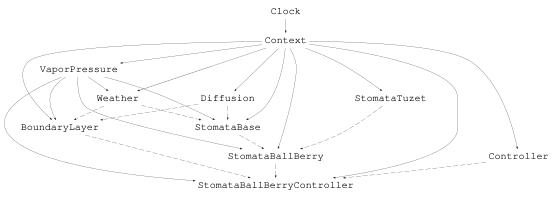

In [47]:
Cropbox.hierarchy(StomataBallBerryController)

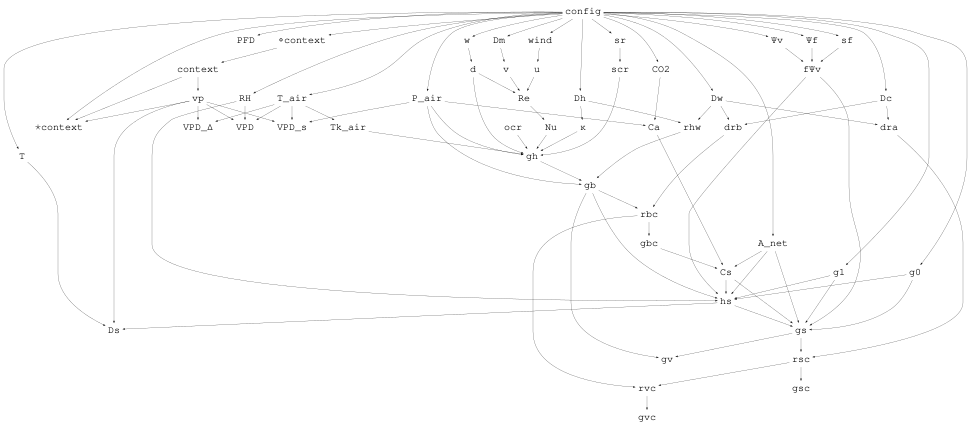

In [48]:
Cropbox.dependency(StomataBallBerryController)

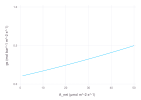

In [49]:
visualize(StomataBallBerryController, :A_net, :gs;
    xstep = :0 => :A_net => 0:50,
    kind=:line
)

Cropbox recently got a new `manipulate()` function to build an interactive plot. It looks like `visualize()` but also accepts a range of parameter values in `parameters` argument as similar to `calibrate()` function. Then these parameter ranges will be automatically transformed into a set of interactive widgets like sliders. This feature is implemented based on [Interact.jl](https://github.com/JuliaGizmos/Interact.jl) and [WebIO.jl](https://github.com/JuliaGizmos/WebIO.jl).

In [50]:
manipulate(StomataBallBerryController, :A_net, :gs;
    parameters = :StomataBallBerry => (;
        g0 = 0:0.01:1,
        g1 = 0:0.1:10,
    ),
    xstep = :0 => :A_net => 0:50,
    ylim = (0,2),
    kind=:line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["StomataBallBerry"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["g0"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 101,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
51, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f1820555d50, Task (runnable) @0x00007f1820555d50), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                co

##### Medlyn Model

$$
g_{s_\textrm{MED}} = g_{0_\textrm{MED}} + \bigg( 1 + \frac{g_{1_\textrm{MED}}}{\sqrt{D_s}} \bigg) \frac{A_n}{C_s} f_{\Psi_v}
$$

$$
(w_s - w_a) g_b = (w_i - w_s) g_{s_\textrm{MED}}
$$

In [51]:
@system StomataMedlyn(StomataBase, StomataTuzet) begin
    g0 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 ~ preserve(u"√kPa", parameter)

    wa(ea=vp.ea, T_air, RH): vapor_pressure_at_air => ea(T_air, RH) ~ track(u"kPa")
    wi(es=vp.es, T): vapor_pressure_at_intercellular_space => es(T) ~ track(u"kPa")
    ws(Ds, wi): vapor_pressure_at_leaf_surface => (wi - Ds) ~ track(u"kPa")
    Ds¹ᐟ²(g0, g1, gb, A_net, Cs, fΨv, wi, wa) => begin
        gs = g0 + (1 + g1 / Ds¹ᐟ²) * (A_net / Cs) * fΨv
        ws = wi - Ds¹ᐟ²^2
        (ws - wa)*gb ⩵ (wi - ws)*gs
    end ~ solve(lower=0, upper=√wi', u"√kPa")
    Ds(Ds¹ᐟ²): vapor_pressure_deficit_at_leaf_surface => Ds¹ᐟ²^2 ~ track(u"kPa", min=1u"Pa")
    hs(RH=vp.RH, T, Ds): relative_humidity_at_leaf_surface => RH(T, Ds) ~ track

    gs(g0, g1, A_net, Ds, Cs, fΨv): stomatal_conductance => begin
        g0 + (1 + g1/√Ds)*(A_net/Cs) * fΨv
    end ~ track(u"mol/m^2/s/bar", min=g0)
end

StomataMedlyn

#### Intercellular Space

$$
\begin{align}
C_m \approx C_i &= C_a - \frac{A_n}{g_{v_c}} \\
g_{v_c} &= \frac{1}{r_{v_c}} \\
r_{v_c} &= r_{s_c} + r_{b_c} \\
r_{s_c} &= \frac{1}{g_s} \cdot {\left( \frac{\mathcal{D}_w}{\mathcal{D}_c} \right)}^{\!1}  \\
r_{b_c} &= \frac{1}{g_b} \cdot {\left( \frac{\mathcal{D}_w}{\mathcal{D}_c} \right)}^{\!\frac{2}{3}}
\end{align}
$$

In [52]:
@system IntercellularSpace(Weather) begin
    A_net ~ hold
    gvc ~ hold

    Ca(CO2, P_air): co2_air => (CO2 * P_air) ~ track(u"μbar")
    Cimax(Ca): intercellular_co2_upper_limit => 2Ca ~ track(u"μbar")
    Cimin: intercellular_co2_lower_limit => 0 ~ preserve(u"μbar")
    Ci(Ca, Ci, A_net, gvc): intercellular_co2 => begin
        Ca - Ci ⩵ A_net / gvc
    end ~ bisect(min=Cimin, upper=Cimax, u"μbar")
end

IntercellularSpace

#### Ex 6.3.

Examine the coupling process of the sub-models for photosynthesis and transpiration through stomatal conductance.

### Energy Balance

$$
T_l = T_a + \Delta T
$$

$$
R_n - H - \lambda E = 0
$$

$$
\begin{align}
R_n &= R_{sw} + R_{lw} \\
R_{sw} &= \alpha_s k I \\
R_{lw} &= 2 \epsilon \sigma (T_{a_k}^4 - T_{l_k}^4)
\end{align}
$$

$$
H = C_p g_h \Delta T
$$

$$
\begin{align}
E &= g_v \Delta w \\
g_v &= \frac{1}{\cfrac{1}{g_s} + \cfrac{1}{g_b}} \\
D &= e_s[T_l] - e_a
\end{align}
$$

| Symbol | Units | Description |
|:-------|:------|:------------|
$\Delta w$ | $\mathrm{kPa}$ | Vapor pressure gradient between leaf surface and the air |
$e_a$ | $\mathrm{kPa}$ | Vapor pressure in the ambient air |
$e_s$ | $\mathrm{kPa}$ | Saturated vapor pressure |
$E$ | $\mathrm{mmol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ | Transpiration rate |
$g_v$ | $\mathrm{mol_{H_2O}}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ $\mathrm{bar^{-1}}$ | Total leaf conductance to water vapor |
$H$ | $\mathrm{W}$ $\mathrm{m^{-2}}$ | Sensible heat flux |
$\lambda E$ | $\mathrm{W}$ $\mathrm{m^{-2}}$ | Latent heat flux |
$R_n$ | $\mathrm{W}$ $\mathrm{m^{-2}}$ | Net radiation absorbed |
$\Delta T$ | $\mathrm{K}$ | Temperature difference between $T_l$ and $T_a$ |

| Symbol | Value | Units | Description |
|:-------|:------|:------|:------------|
$\alpha_s$ | 0.79 | - | Radiation absorption coefficient of the leaf |
$C_p$ | 29.3 | $\mathrm{J}$ $\mathrm{mol^{-1}}$ $\mathrm{K^{-1}}$ | Specific heat of air |
$\epsilon$ | 0.97 | - | Leaf thermal emissivity |
$k$ | 0.22 | $\mathrm{J}$ $\mathrm{\mu mol^{-1}}$ | Radiation conversion factor |
$\lambda$ | 44 | $\mathrm{kJ}$ $\mathrm{mol^{-1}}$ | Latent heat of vaporization at 25 $\mathrm{^{\circ}C}$ |
$\sigma$ | 5.670 $\times 10^{-8}$ | $\mathrm{W}$ $\mathrm{m^{-2}}$ $\mathrm{K^{-4}}$ | Stefan-Boltzmann constant |

In [53]:
@system EnergyBalance(Weather) begin
    gv ~ hold
    gh ~ hold
    PPFD ~ hold

    ϵ: leaf_thermal_emissivity => 0.97 ~ preserve(parameter)
    σ: stefan_boltzmann_constant => u"σ" ~ preserve(u"W/m^2/K^4")
    λ: latent_heat_of_vaporization_at_25 => 44 ~ preserve(u"kJ/mol", parameter)
    Cp: specific_heat_of_air => 29.3 ~ preserve(u"J/mol/K", parameter)

    k: radiation_conversion_factor => (1 / 4.55) ~ preserve(u"J/μmol")
    α_s: absorption_coefficient => 0.79 ~ preserve(parameter)
    PAR(PPFD, k): photosynthetically_active_radiation => (PPFD * k) ~ track(u"W/m^2")
    R_sw(PAR, α_s): shortwave_radiation_absorbed => (α_s * PAR) ~ track(u"W/m^2")

    R_wall(ϵ, σ, Tk_air): thermal_radiation_absorbed_from_wall => 2ϵ*σ*Tk_air^4 ~ track(u"W/m^2")
    R_leaf(ϵ, σ, Tk): thermal_radiation_emitted_by_leaf => 2ϵ*σ*Tk^4 ~ track(u"W/m^2")
    R_thermal(R_wall, R_leaf): thermal_radiation_absorbed => R_wall - R_leaf ~ track(u"W/m^2")
    R_net(R_sw, R_thermal): net_radiation_absorbed => R_sw + R_thermal ~ track(u"W/m^2")

    Δw(T, T_air, RH, ea=vp.ambient, es=vp.saturation): leaf_vapor_pressure_gradient => begin
        es(T) - ea(T_air, RH)
    end ~ track(u"kPa")
    E(gv, Δw): transpiration => gv*Δw ~ track(u"mmol/m^2/s")

    H(Cp, gh, ΔT): sensible_heat_flux => Cp*gh*ΔT ~ track(u"W/m^2")
    λE(λ, E): latent_heat_flux => λ*E ~ track(u"W/m^2")

    ΔT(R_net, H, λE): temperature_adjustment => begin
        R_net ⩵ H + λE
    end ~ bisect(lower=-10, upper=10, u"K", evalunit=u"W/m^2")

    T(T_air, ΔT): leaf_temperature => (T_air + ΔT) ~ track(u"°C")
    Tk(T): absolute_leaf_temperature ~ track(u"K")
end

EnergyBalance

#### Ex 6.1.3)

Examine how the following individual components of a coupled gas-exchange model are implemented in Cropbox: 3) energy balance equation to calculate transpiration and leaf temperature.

Variable `ΔT` implemented with `bisect` will try a range of values between `lower` and `upper` boundary to find the best solution satisfying the equation (`R_net ⩵ H + λE`) in the declaration body. It corresponds to the outer loop illustrated in the schematic diagram of a coupled gas-exchange model flow.

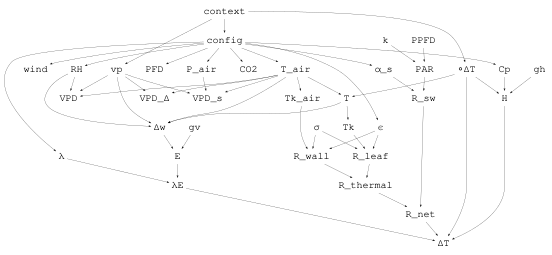

In [54]:
Cropbox.dependency(EnergyBalance)

In [55]:
display("text/plain", Cropbox.dependency(EnergyBalance))

[k → σ → PPFD → PAR → gh → gv → context → ∘ΔT → vp → config → α_s → R_sw → Cp → H → λ → ϵ → P_air → wind → T_air → T → Tk → R_leaf → VPD_s → VPD_Δ → Tk_air → R_wall → R_thermal → R_net → RH → Δw → E → λE → ΔT → VPD → CO2 → PFD]

### Coupling

In [56]:
@system GasExchange(Weather, BoundaryLayer, StomataBase, IntercellularSpace, Irradiance, EnergyBalance)

GasExchange

In [57]:
@system C3BB(GasExchange, StomataBallBerry, C3, Controller) begin
    g0 => 0.096 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 => 6.824 ~ preserve(parameter)
end

C3BB

In [58]:
@system C4BB(GasExchange, StomataBallBerry, C4, Controller) begin
    g0 => 0.036 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 => 2.792 ~ preserve(parameter)
end

C4BB

In [59]:
@system C4MED(GasExchange, StomataMedlyn, C4, Controller) begin
    g0 => 0.031 ~ preserve(u"mol/m^2/s/bar", parameter)
    g1 => 1.281 ~ preserve(u"√kPa", parameter)
end

C4MED

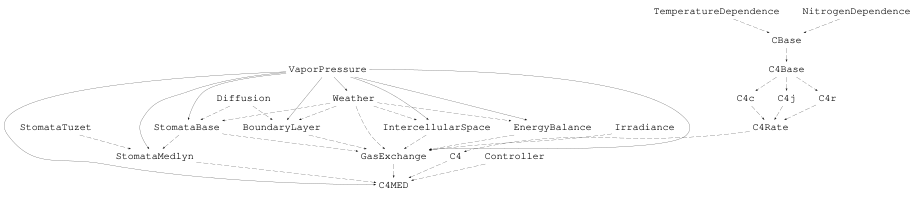

In [60]:
Cropbox.hierarchy(C4MED; skipcontext=true)

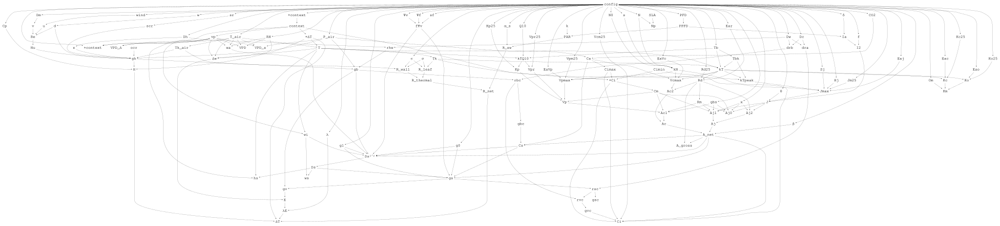

In [61]:
Cropbox.dependency(C4MED)

## Results

#### Ex 6.4.

Based on the coupled models of C3 and C4 leaves, generate $A/C_i$ and light response ($A/Q$) curves for C3 and C4 leaves, and identify limiting processes (Ac, Aj, or Ap). Assume that all other conditions are optimal for photosynthesis except the variable of interest (*i.e.*, CO2 and PFD).

In [62]:
parameters(Weather)

Config for 1 systems:
  Weather
    PFD   = 2000 μmol m^-2 s^-1
    CO2   = 400 μmol mol^-1
    RH    = 66 %
    T_air = 32 °C
    wind  = 2.0 m s^-1
    P_air = 99.4 kPa

In [63]:
co2_xstep = :Weather => :CO2 => 10:10:1500;
pfd_xstep = :Weather => :PFD => 0:20:2000;
ta_xstep = :Weather => :T_air => 0:1:45;
rh_xstep = :Weather => :RH => 0:1:100;

In [64]:
co2_group = :Weather => :CO2 => [1000, 400, 250];
pfd_group = :Weather => :PFD => 1800:-400:600;
ta_group = :Weather => :T_air => 40:-5:10;
rh_group = :Weather => :RH => 80:-20:20;

### C3

#### A-Ci

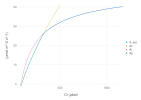

In [65]:
visualize(C3BB, :Ci, [:A_net, :Ac, :Aj, :Ap]; xstep=co2_xstep, ylim=(0,40), kind=:line)

#### A-Q

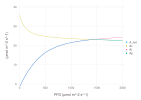

In [66]:
visualize(C3BB, :PFD, [:A_net, :Ac, :Aj, :Ap]; xstep=pfd_xstep, ylim=(0,40), kind=:line)

#### A-T

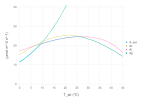

In [67]:
visualize(C3BB, :T_air, [:A_net, :Ac, :Aj, :Ap]; xstep=ta_xstep, ylim=(0,40), kind=:line)

### C4

#### A-Ci

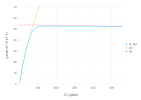

In [68]:
visualize(C4MED, :Ci, [:A_net, :Ac, :Aj]; xstep=co2_xstep, ylim=(0,70), kind=:line)

#### A-Q

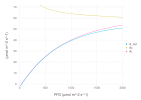

In [69]:
visualize(C4MED, :PFD, [:A_net, :Ac, :Aj]; xstep=pfd_xstep, ylim=(0,70), kind=:line)

#### A-T

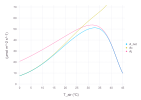

In [70]:
visualize(C4MED, :T_air, [:A_net, :Ac, :Aj]; xstep=ta_xstep, ylim=(0,70), kind=:line)

#### Transition smoothing factor ($\beta$)

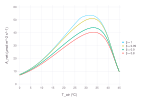

In [71]:
let S = C4MED, x = :T_air, y = :A_net, xstep = ta_xstep, ylim = (0,60), kind = :line,
    p = visualize(S, x, y; xstep, ylim, kind, name = "β = 1", config = :0 => :β => 1)
    p = visualize!(p, S, x, y; xstep, kind, name = "β = 0.99", config = :0 => :β => 0.99)
    p = visualize!(p, S, x, y; xstep, kind, name = "β = 0.9", config = :0 => :β => 0.9)
    p = visualize!(p, S, x, y; xstep, kind, name = "β = 0.8", config = :0 => :β => 0.8)
end

In [72]:
manipulate(C4MED, :T_air, :A_net;
    parameters = :C4Rate => :β => 0.01:0.01:1,
    xstep = ta_xstep,
    ylim = (0,60),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["C4Rate"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["β"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 100,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
50, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f180c8ff0d0, Task (runnable) @0x00007f180c8ff0d0), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context,\n   

#### Ex 6.5.

Explore how C3 and C4 leaves will respond over a wide range of temperatures under the atmospheric CO2 concentrations of **250 ppm, 400 ppm, and 1000 ppm**. Assume other environmental conditions are favorable with saturating light level (PFD = 2,000 $\mathrm{\mu mol}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$).

In [73]:
@config co2_group

Config for 1 systems:
  Weather
    CO2 = [1000, 400, 250]

#### Ex 6.5.a.

Generate figures to compare C3 and C4 temperature response curves at different CO2 concentrations similar to shown below in Fig 6.2.

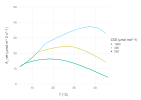

In [74]:
visualize(C3BB, :T, :A_net;
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,50),
    kind = :line,
)

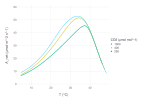

In [75]:
visualize(C4BB, :T, :A_net;
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

#### Ex 6.5.b.

Identify the **air temperature and CO2** conditions where photorespiration becomes substantial in the figures, and discuss why those conditions.

#### Ex 6.5.c.

Do the same comparisons with water-stressed C3 and C4 leaves at -1.5 MPa of leaf water potential and compare their responses.

In [76]:
manipulate(C3BB, :T, :A_net;
    parameters = :StomataTuzet => :Ψv => -3:0.1:0,
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,50),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["StomataTuzet"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Ψv"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 31,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
16, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f1821eac760, Task (runnable) @0x00007f1821eac760), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context

In [77]:
manipulate(C4BB, :T, :A_net;
    parameters = :StomataTuzet => :Ψv => -3:0.1:0,
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["StomataTuzet"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Ψv"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 31,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
16, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f180c464010, Task (runnable) @0x00007f180c464010), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context

#### Ex 6.5.d.

Now replenish the leaves with ample water but reduce the light level to 200 $\mathrm{\mu mol}$ $\mathrm{m^{-2}}$ $\mathrm{s^{-1}}$ of PFD and compare the responses.

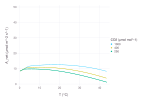

In [78]:
visualize(C3BB, :T, :A_net;
    config = :0 => (:Ψv => 0, :PFD => 200),
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,50),
    kind = :line,
)

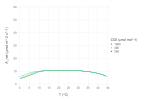

In [79]:
visualize(C4BB, :T, :A_net;
    config = :0 => (:Ψv => 0, :PFD => 200),
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

In [80]:
manipulate(C3BB, :T, :A_net;
    parameters = (
        :StomataTuzet => :Ψv => -3:0.1:0,
        :Weather => :PFD => 0:100:2000,
    ),
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,50),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["StomataTuzet"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Ψv"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 31,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
16, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f180c8ff340, Task (runnable) @0x00007f180c8ff340), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context

In [81]:
manipulate(C4BB, :T, :A_net;
    parameters = (
        :StomataTuzet => :Ψv => -3:0.1:0,
        :Weather => :PFD => 0:100:2000,
    ),
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["StomataTuzet"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["Ψv"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 31,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
16, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f180f80d390, Task (runnable) @0x00007f180f80d390), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                context

#### Ex 6.5.e.

Based on these simulations, do you think the competitive relationship between C3 and C4 plants will likely change in the future climate with elevated [CO2], warmer temperatures, and more frequent drought episodes? If so, how and why?

#### Ex 6.6.

Examine how leaf water and nitrogen status is implemented in the coupled model and study their behavior by experimenting with the parameter values associated their responses.

#### Nitrogen Stress

In [82]:
nitrogen_group = :NitrogenDependence => :N => 2:-0.5:0.5;
nitrogen_xstep = :NitrogenDependence => :N => 0.5:0.01:2.0;

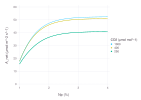

In [83]:
visualize(C4MED, :Np, :A_net;
    xstep = nitrogen_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

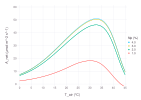

In [84]:
visualize(C4MED, :T_air, :A_net;
    xstep = ta_xstep,
    group = nitrogen_group,
    names = :Np,
    ylim = (0,60),
    kind = :line,
)

#### Water Stress

In [85]:
water_group = :StomataTuzet => :Ψv => 0:-0.5:-2;
water_xstep = :StomataTuzet => :Ψv => -2:0.02:0;

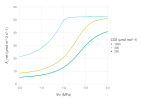

In [86]:
visualize(C4MED, :Ψv, :A_net;
    xstep = water_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

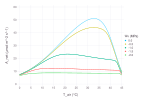

In [87]:
visualize(C4MED, :T_air, :A_net;
    xstep = ta_xstep,
    group = water_group,
    ylim = (0,60),
    kind = :line,
)

#### Nitrogen x Water Stress

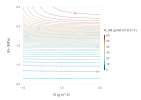

In [88]:
visualize(C4MED, :N, :Ψv, :A_net;
    config = :Weather => (),
    xstep = :NitrogenDependence => :N => 1:0.02:2,
    ystep = :StomataTuzet => :Ψv => -2:0.04:0,
    kind = :contour,
    aspect = 1,
    zlim = (0,60),
    zgap = 1,
    zlabgap = 10,
)

#### Interactive Plot

In [89]:
manipulate(C4MED, :T, :A_net;
    parameters = (
        :NitrogenDependence => :N => 0:0.05:3,
        :StomataTuzet => :Ψv => -3:0.05:0,
    ),
    xstep = ta_xstep,
    group = co2_group,
    ylim = (0,60),
    kind = :line,
)

WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any["NitrogenDependence"], Dict{Symbol,Any}(:style => Dict{String,Any}("color" => :darkorchid,"font-family" => "monospace"))), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Scope(WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :label), Any["N"], Dict{Symbol,Any}(:className => "interact ",:style => Dict{Any,Any}(:padding => "5px 10px 0px 10px","color" => :royalblue)))], Dict{Symbol,Any}(:className => "interact-flex-row-left")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :input), Any[], Dict{Symbol,Any}(:max => 61,:min => 1,:attributes => Dict{Any,Any}(:type => "range",Symbol("data-bind") => "numericValue: index, valueUpdate: 'input', event: {change: function (){this.changes(this.changes()+1)}}","orient" => "horizontal"),:step => 1,:className => "slider slider is-fullwidth",:style => Dict{Any,Any}()))], Dict{Symbol,Any}(:className => "interact-flex-row-center")), WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :div), Any[WebIO.Node{WebIO.DOM}(WebIO.DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes => Dict("data-bind" => "text: formatted_val")))], Dict{Symbol,Any}(:className => "interact-flex-row-right"))], Dict{Symbol,Any}(:className => "interact-flex-row interact-widget",:style => Dict("font-family" => "monospace","width" => "25%"))), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes" => (Observable{Int64} with 2 listeners. Value:
0, nothing),"index" => (Observable{Any} with 2 listeners. Value:
31, nothing)), Set{String}(), nothing, WebIO.Asset[WebIO.Asset("js", "knockout", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout.js"), WebIO.Asset("js", "knockout_punches", "/srv/julia/pkg/packages/Knockout/IP1uR/src/../assets/knockout_punches.js"), WebIO.Asset("js", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/all.js"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/InteractBase/sOe2Z/src/../assets/style.css"), WebIO.Asset("css", nothing, "/srv/julia/pkg/packages/Interact/SbgIk/src/../assets/bulma_confined.min.css")], Dict{Any,Any}("changes" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"changes\"]()) ? (this.valueFromJulia[\"changes\"]=true, this.model[\"changes\"](val)) : undefined})")],"index" => Any[WebIO.JSString("(function (val){return (val!=this.model[\"index\"]()) ? (this.valueFromJulia[\"index\"]=true, this.model[\"index\"](val)) : undefined})")]), WebIO.ConnectionPool(Channel{Any}(sz_max:32,sz_curr:0), Set{WebIO.AbstractConnection}(), Base.GenericCondition{Base.AlwaysLockedST}(Base.InvasiveLinkedList{Task}(Task (runnable) @0x00007f180e807340, Task (runnable) @0x00007f180e807340), Base.AlwaysLockedST(1))), WebIO.JSString[WebIO.JSString("function () {\n    var handler = (function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init: function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            });\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            });\n            ko.applyBindingsToNode(\n                element,\n                {\n                    value: stringified,\n                    valueUpdate: allBindings.get('valueUpdate'),\n                },\n                co